In [3]:
import data
import matplotlib.pyplot as plt
import model
import tensorflow as tf
import model_without_adding_layer
import keras
from keras.datasets import mnist

2025-05-31 15:39:17.387136: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-31 15:39:17.399743: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748698757.408082  544465 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748698757.410522  544465 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1748698757.416972  544465 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

Found 80000 files belonging to 100 classes.
Using 64000 files for training.


I0000 00:00:1748698764.196643  544465 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 18160 MB memory:  -> device: 0, name: NVIDIA RTX 4000 Ada Generation, pci bus id: 0000:01:00.0, compute capability: 8.9


Found 80000 files belonging to 100 classes.
Using 16000 files for validation.


In [5]:
class_names = data.train_dataset.class_names

one_batch = data.train_dataset.take(1)
for images, labels in one_batch:
    imaqe_batch_shape = images.shape
    label_batch_shape = labels.shape
    image_shape = images[0].shape
    label_shape = labels[0].shape

print(imaqe_batch_shape, label_batch_shape, image_shape, label_shape) 


AttributeError: '_MapDataset' object has no attribute 'class_names'

2025-05-31 15:35:44.131022: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


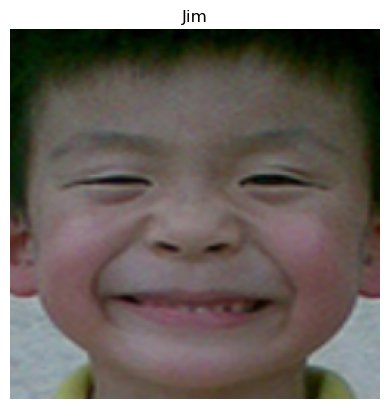

In [3]:
for images, labels in data.dataset.take(1):

    for i in range(len(images)):
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
        #plt.show()
        

In [2]:
(X_train_mnist, y_train_mnist), (X_test_mnist, y_test_mnist) = mnist.load_data()

X_train_mnist = X_train_mnist.reshape(-1, 28, 28, 1)
X_test_mnist = X_test_mnist.reshape(-1, 28, 28, 1)


NameError: name 'mnist' is not defined

In [5]:
def validation(my_model : keras.Model, num_of_batchs : int):
    class_names = data.dataset.class_names
    for images, labels in data.augmented_val_dataset.take(num_of_batchs):
        prediction = my_model.predict(images)
        predicted_labels = tf.argmax(prediction, axis = 1).numpy()

        for i in range(len(images)):
            plt.imshow(images[i])
            true_label = class_names[labels[i]]
            predicted_label = class_names[predicted_labels[i]]
            plt.show()
            print(f"the true label is : {true_label} and the predicted label is : {predicted_label}")

In [1]:
model_without_adding = model_without_adding_layer.build_model()

history = model_without_adding.fit(
    X_train_mnist,
    y_train_mnist,
    #epochs=10
)

NameError: name 'model_without_adding_layer' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


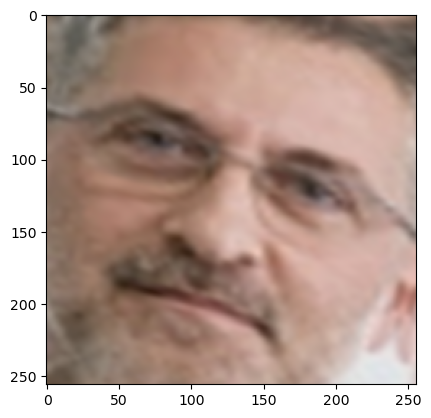

the true label is : Nicolas and the predicted label is : Amanda


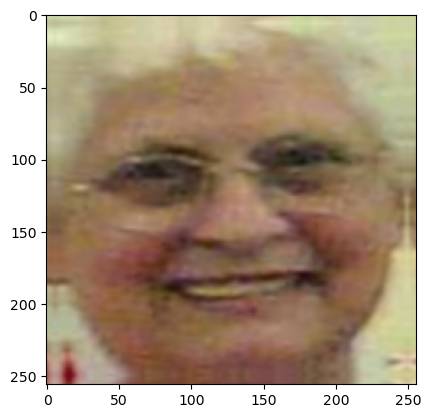

the true label is : Grace and the predicted label is : Amanda


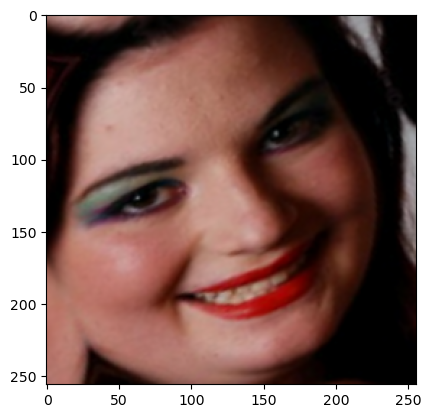

the true label is : Zoe and the predicted label is : Amanda


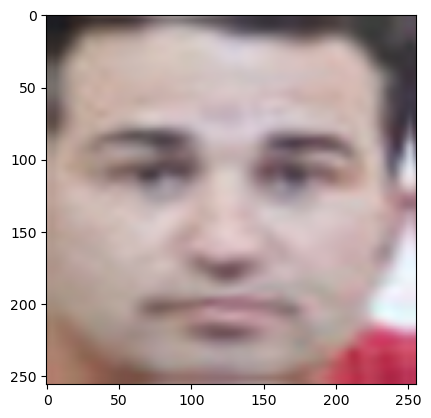

the true label is : Eric and the predicted label is : Amanda


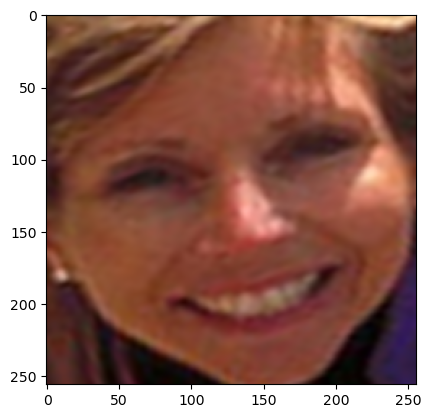

the true label is : Jane and the predicted label is : Amanda


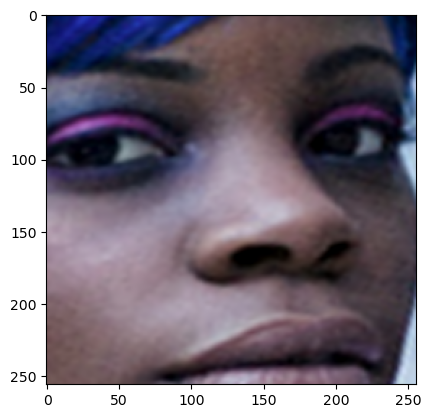

the true label is : Michelle and the predicted label is : Amanda


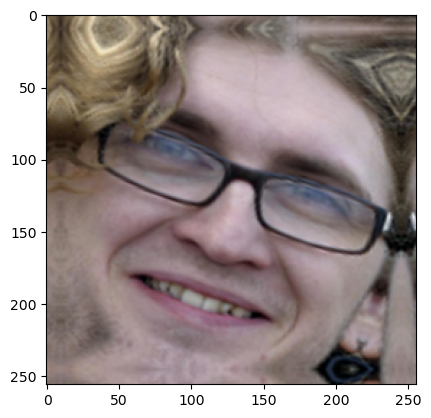

the true label is : Ivan and the predicted label is : Amanda


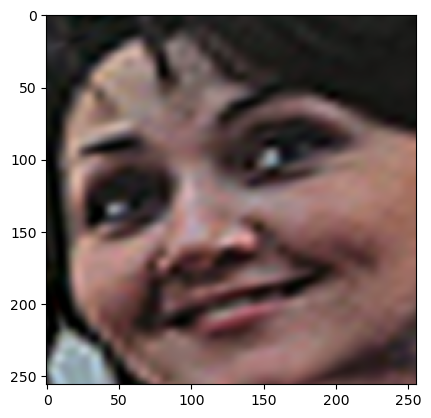

the true label is : Chris and the predicted label is : Amanda


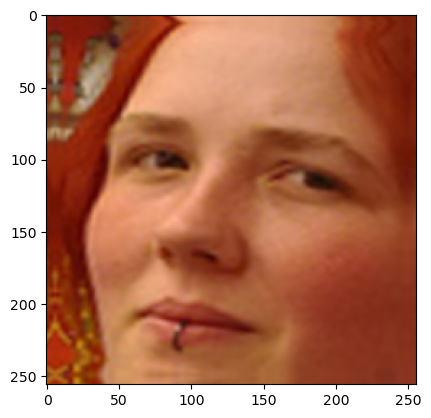

the true label is : Jo and the predicted label is : Amanda


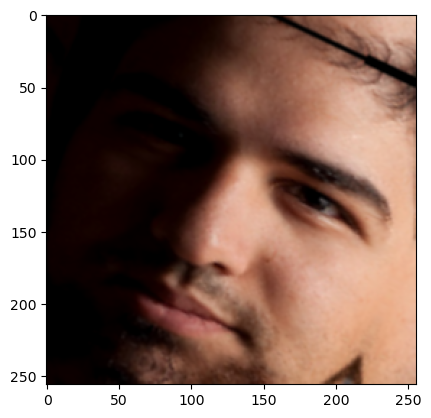

the true label is : Brian and the predicted label is : Amanda


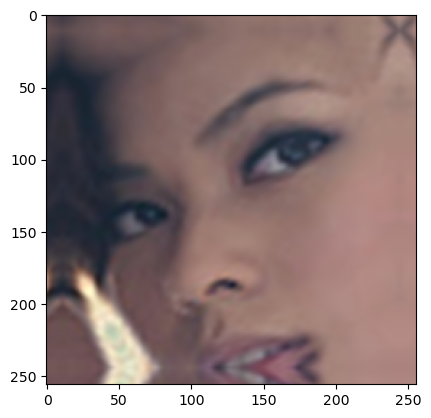

the true label is : Christine and the predicted label is : Amanda


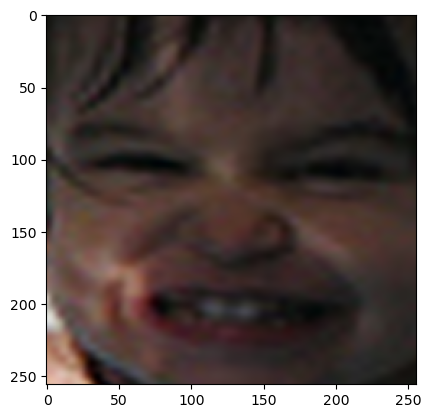

the true label is : Angela and the predicted label is : Amanda


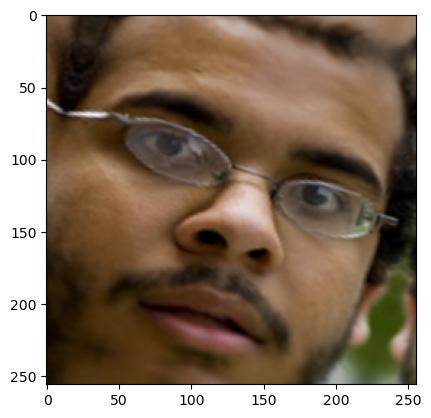

the true label is : James and the predicted label is : Amanda


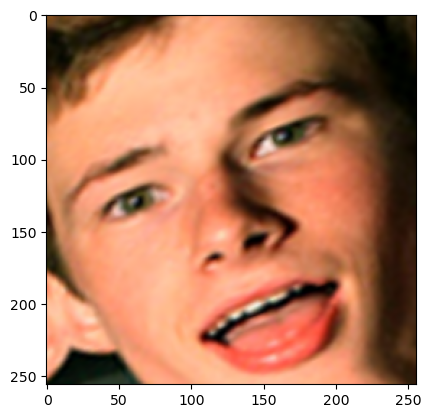

the true label is : Joseph and the predicted label is : Amanda


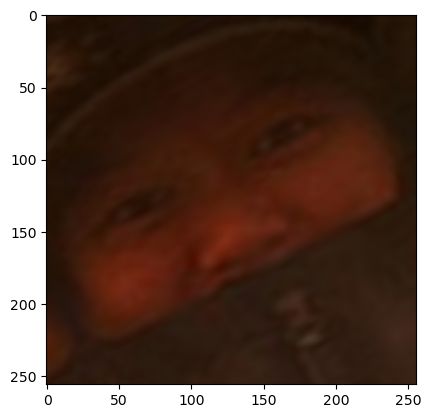

the true label is : Christina and the predicted label is : Amanda


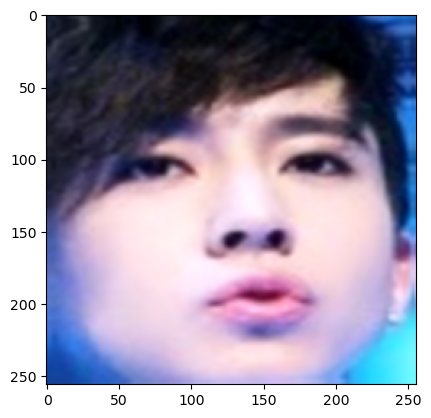

the true label is : Brian and the predicted label is : Amanda


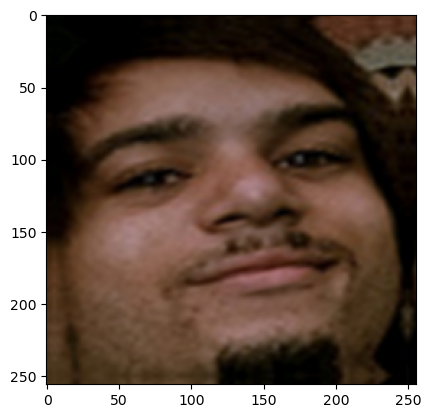

the true label is : Stephen and the predicted label is : Amanda


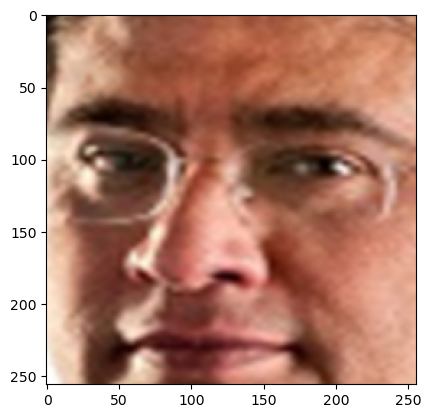

the true label is : Ivan and the predicted label is : Amanda


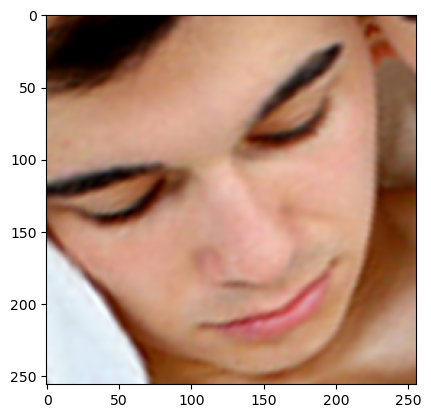

the true label is : Gabriel and the predicted label is : Amanda


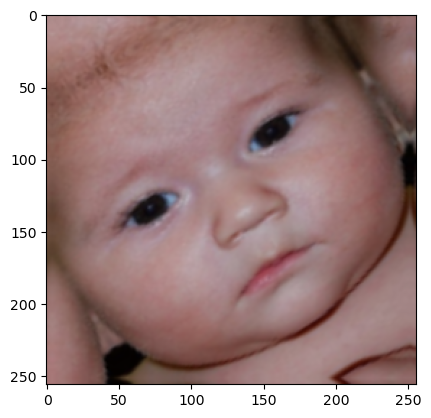

the true label is : Evan and the predicted label is : Amanda


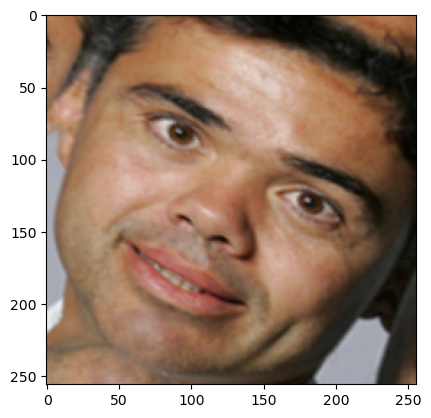

the true label is : Ivan and the predicted label is : Amanda


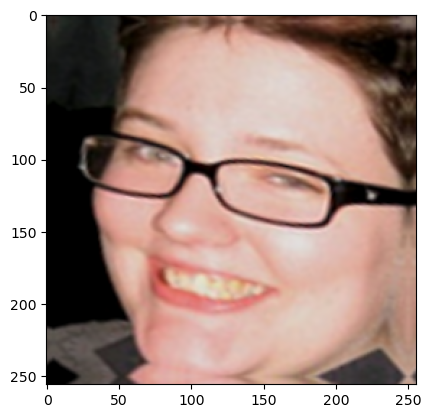

the true label is : Abby and the predicted label is : Amanda


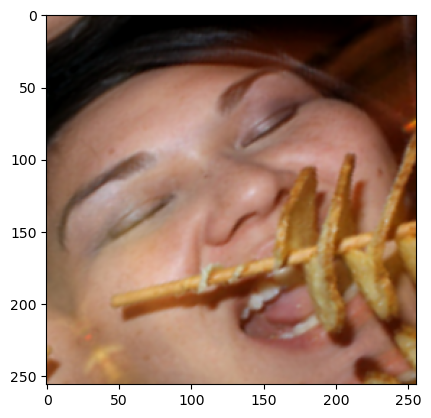

the true label is : Christina and the predicted label is : Amanda


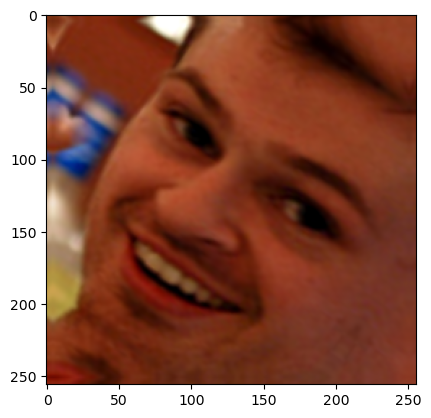

the true label is : Steve and the predicted label is : Amanda


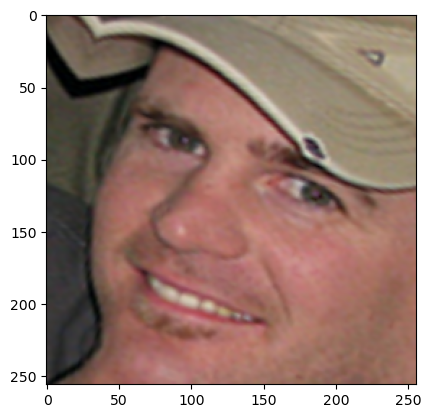

the true label is : Kyle and the predicted label is : Amanda


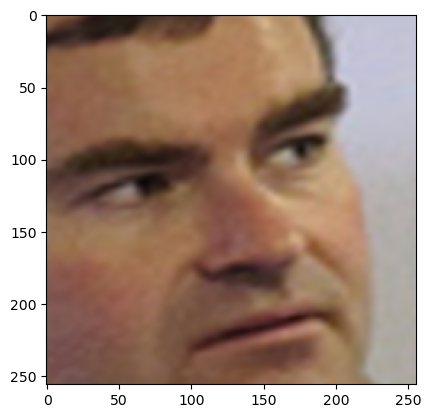

the true label is : David and the predicted label is : Amanda


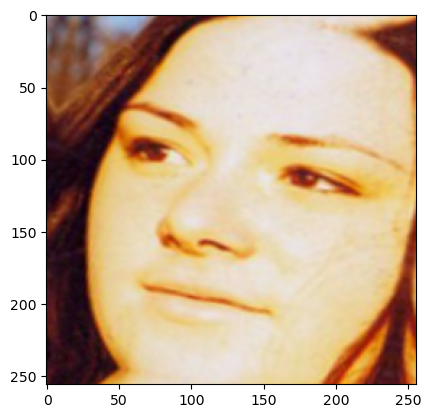

the true label is : Rachel and the predicted label is : Amanda


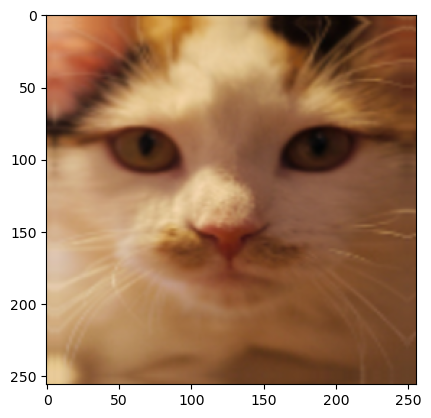

the true label is : Vanessa and the predicted label is : Amanda


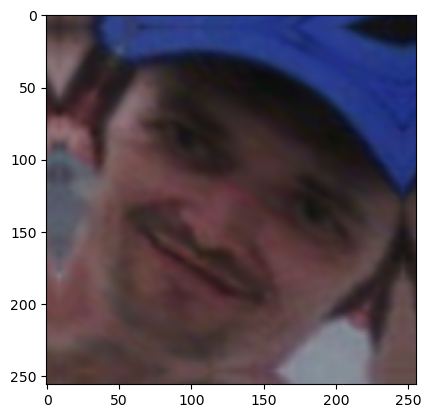

the true label is : Aaron and the predicted label is : Amanda


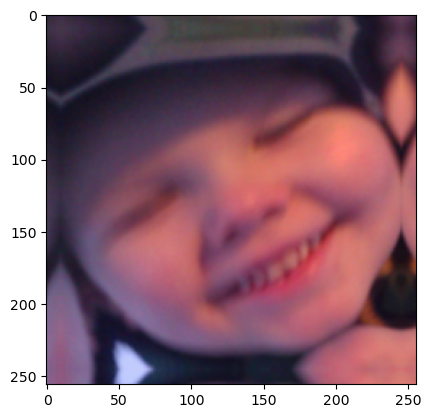

the true label is : Aaron and the predicted label is : Amanda


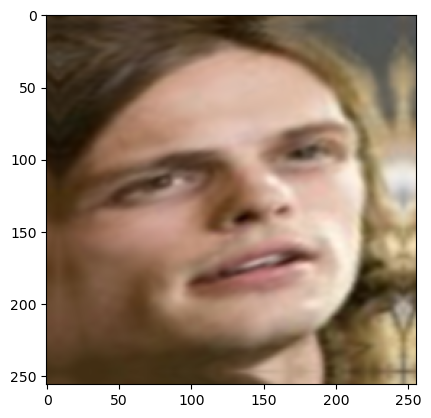

the true label is : Matthew and the predicted label is : Amanda


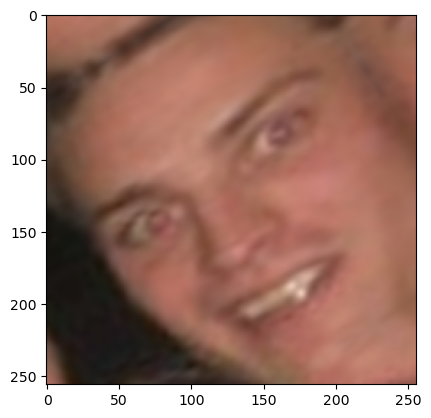

the true label is : Dylan and the predicted label is : Amanda


2025-05-31 15:25:45.985984: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [6]:
validation(model_without_adding, 1)

In [8]:
model_ = model.build_model()

In [10]:
from collections import Counter

label_counts = Counter()
for _, labels in data.augmented_training_dataset.take(1).unbatch():
    label_counts[labels.numpy()] += 1

print(label_counts)

Counter({36: 2, 91: 2, 29: 1, 63: 1, 5: 1, 88: 1, 30: 1, 54: 1, 73: 1, 20: 1, 8: 1, 17: 1, 60: 1, 94: 1, 71: 1, 65: 1, 42: 1, 62: 1, 1: 1, 86: 1, 18: 1, 81: 1, 40: 1, 47: 1, 74: 1, 51: 1, 75: 1, 22: 1, 85: 1, 89: 1})


In [17]:
history = model_.fit(
    data.augmented_training_dataset.take(5),
    validation_data=data.augmented_val_dataset.take(1),
    epochs=10
)

Epoch 1/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 647ms/step - accuracy: 0.0206 - loss: 5.0451 - val_accuracy: 0.0000e+00 - val_loss: 4.7468
Epoch 2/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 646ms/step - accuracy: 0.0150 - loss: 4.9154 - val_accuracy: 0.0312 - val_loss: 7.0999
Epoch 3/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 642ms/step - accuracy: 0.0077 - loss: 4.8967 - val_accuracy: 0.0000e+00 - val_loss: 4.8985
Epoch 4/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 643ms/step - accuracy: 0.0690 - loss: 4.5984 - val_accuracy: 0.0000e+00 - val_loss: 7.5627
Epoch 5/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 646ms/step - accuracy: 0.0873 - loss: 4.5607 - val_accuracy: 0.0000e+00 - val_loss: 6.3643
Epoch 6/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 641ms/step - accuracy: 0.0171 - loss: 4.8089 - val_accuracy: 0.0000e+00 - val_loss: 5.5465
Epoch 7/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 647ms/step - accuracy: 0.0918 - loss: 4.5201 - val_accuracy: 0.0312 - val_loss: 5.0084
Epoch 8/10
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 641ms/step - accuracy: 0.0077 - loss: 4.6325 - val_accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step


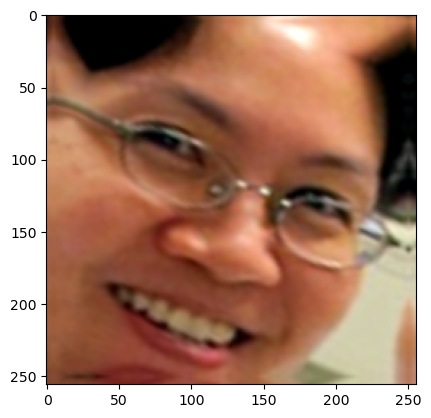

the true label is : Rick and the predicted label is : Jim


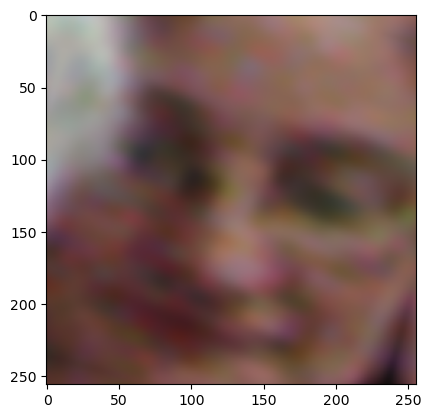

the true label is : Jake and the predicted label is : Jim


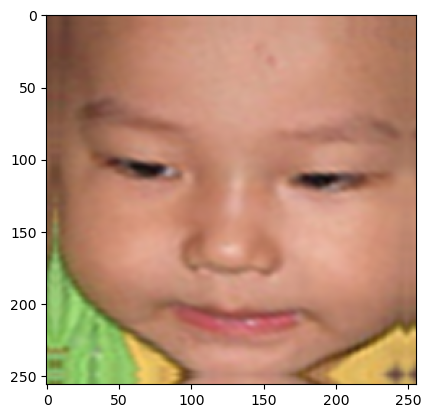

the true label is : Kevin and the predicted label is : Jim


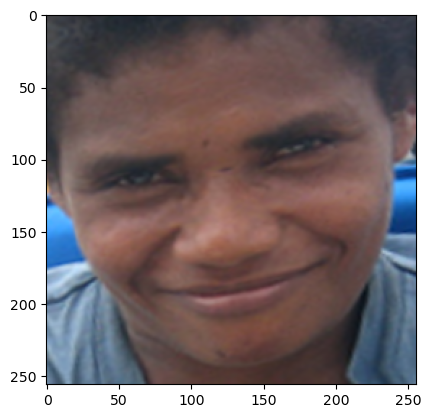

the true label is : Linda and the predicted label is : Jim


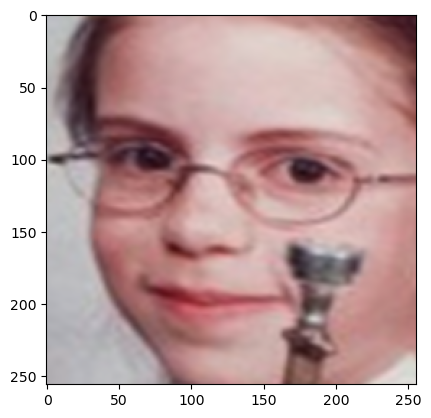

the true label is : Anna and the predicted label is : Jim


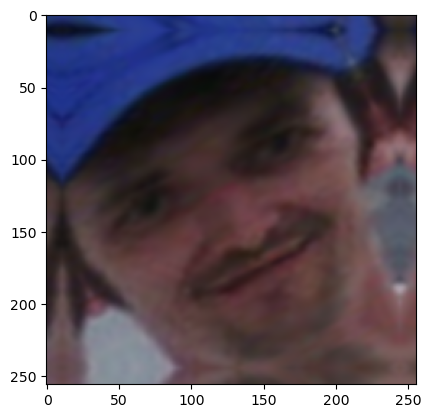

the true label is : Aaron and the predicted label is : Jim


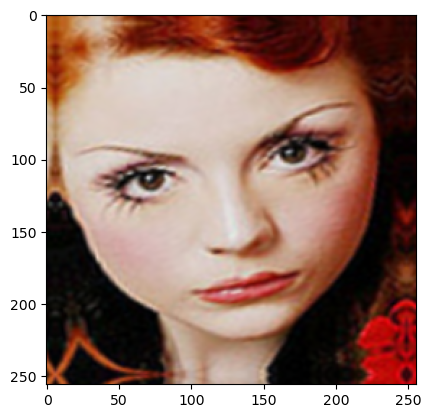

the true label is : Andrea and the predicted label is : Jim


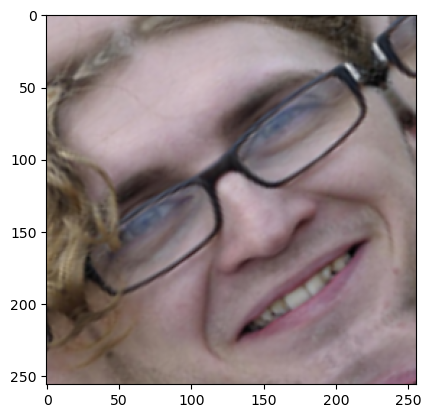

the true label is : Ivan and the predicted label is : Jim


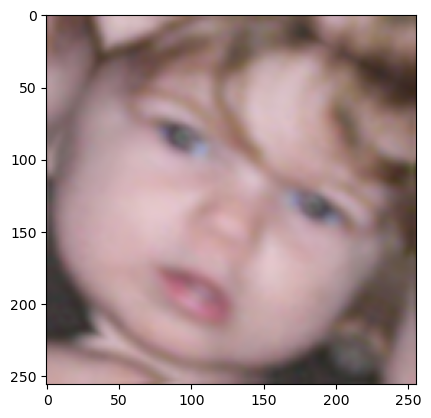

the true label is : Katie and the predicted label is : Jim


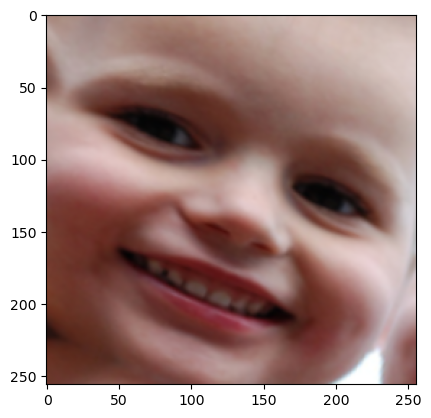

the true label is : Jason and the predicted label is : Jim


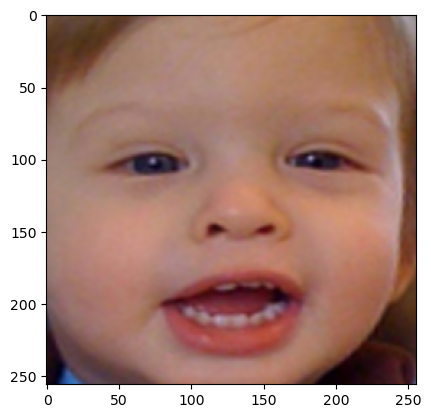

the true label is : David and the predicted label is : Jim


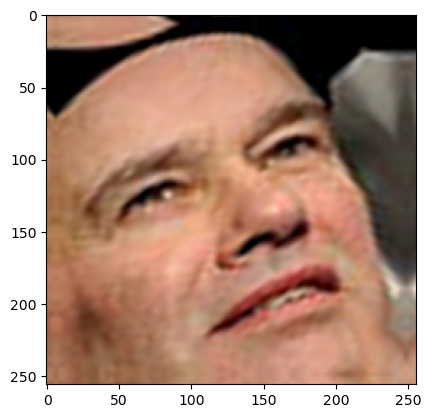

the true label is : Jamie and the predicted label is : Jim


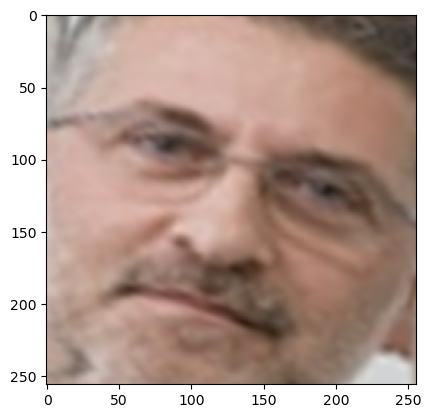

the true label is : Nicolas and the predicted label is : Jim


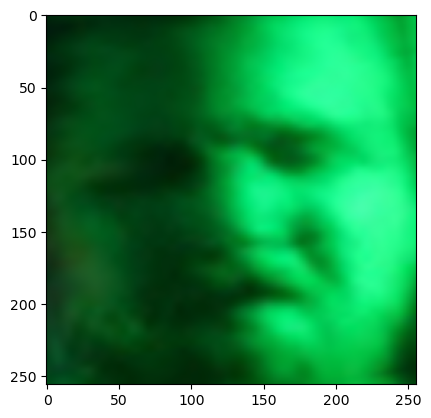

the true label is : Eric and the predicted label is : Jim


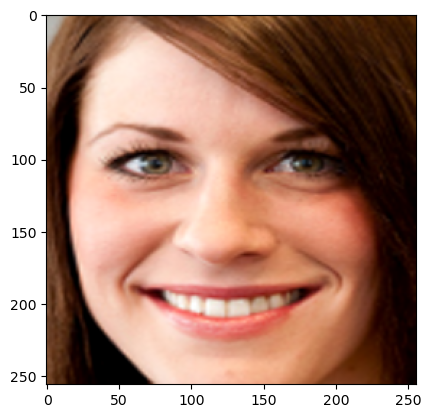

the true label is : Erin and the predicted label is : Jim


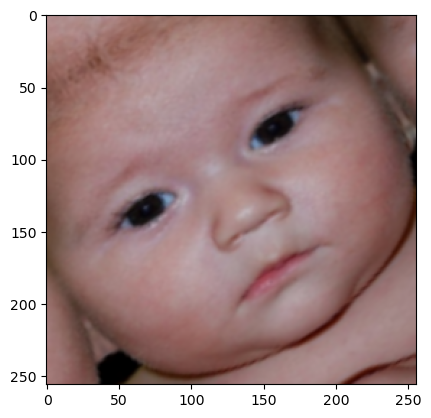

the true label is : Evan and the predicted label is : Jim


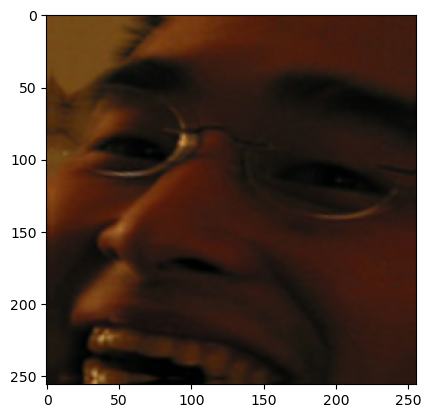

the true label is : Tony and the predicted label is : Joey


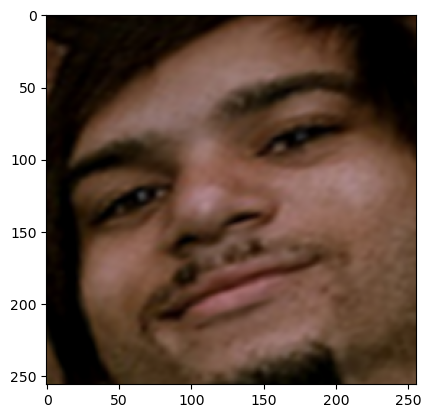

the true label is : Stephen and the predicted label is : Kate


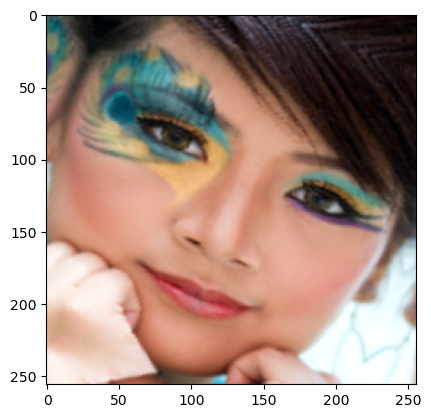

the true label is : Stephanie and the predicted label is : Jim


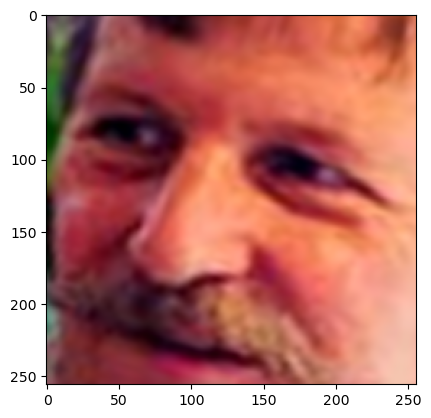

the true label is : Mike and the predicted label is : Jim


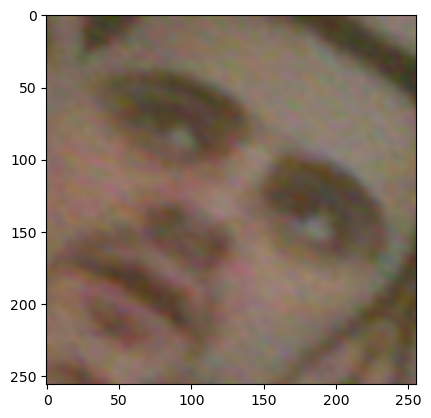

the true label is : Gary and the predicted label is : Kate


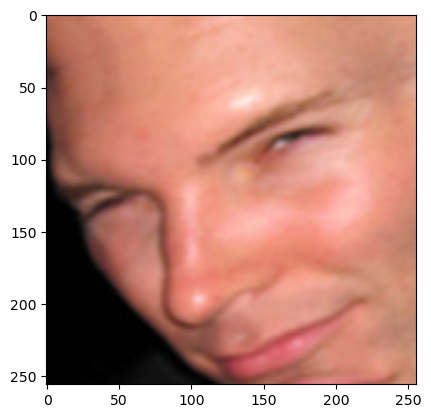

the true label is : Eric and the predicted label is : Jim


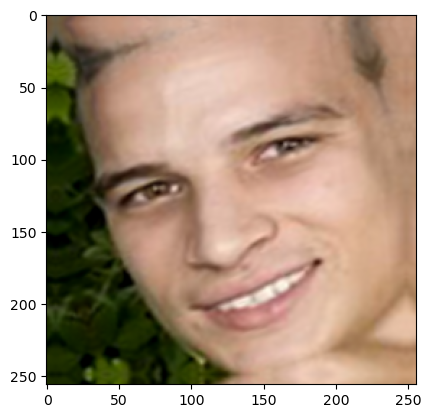

the true label is : Jacob and the predicted label is : Jim


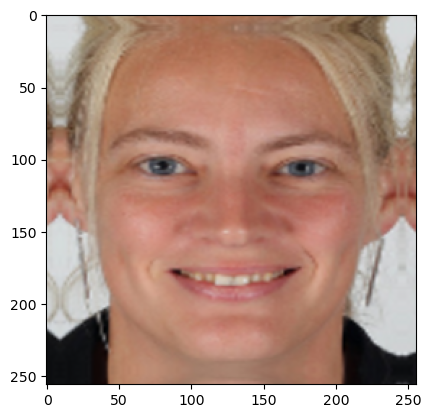

the true label is : Vanessa and the predicted label is : Jim


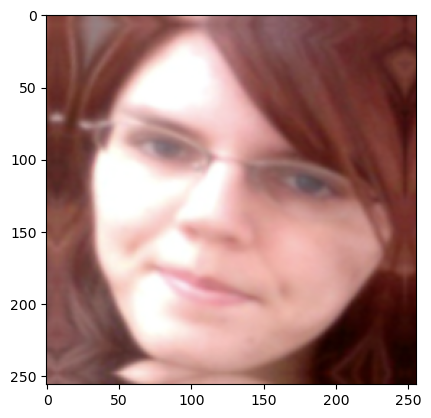

the true label is : Lauren and the predicted label is : Jim


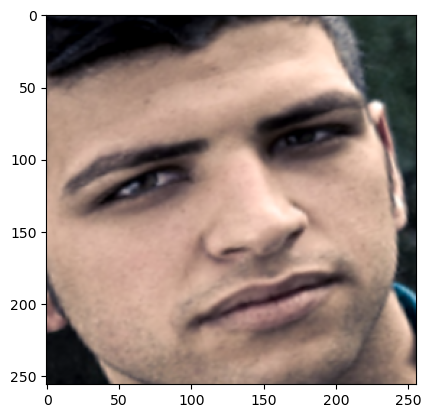

the true label is : Gabriel and the predicted label is : Jim


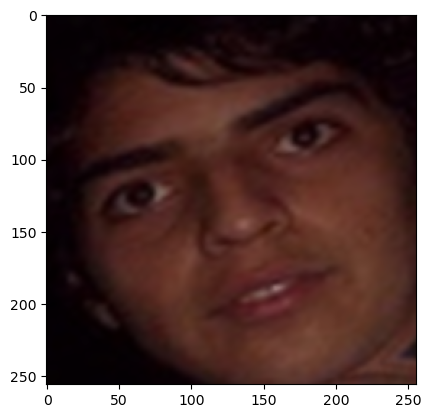

the true label is : Gabriel and the predicted label is : Kate


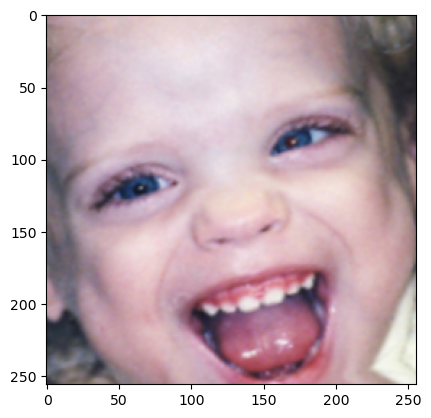

the true label is : Jane and the predicted label is : Jim


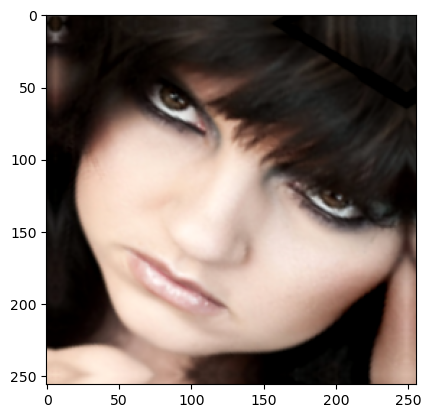

the true label is : Emma and the predicted label is : Jim


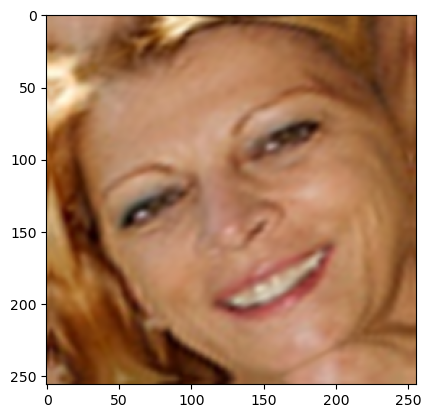

the true label is : Christine and the predicted label is : Jim


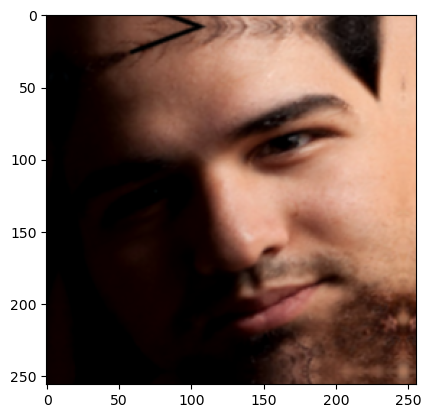

the true label is : Brian and the predicted label is : Jim


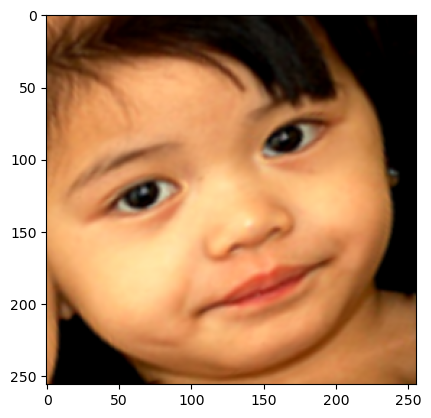

the true label is : Angela and the predicted label is : Jim


In [15]:
for images, labels in data.augmented_val_dataset.take(1):
    prediction = model_.predict(images)
    predicted_labels = tf.argmax(prediction, axis = 1).numpy()

    for i in range(len(images)):
        plt.imshow(images[i])
        true_label = class_names[labels[i]]
        predicted_label = class_names[predicted_labels[i]]
        plt.show()
        print(f"the true label is : {true_label} and the predicted label is : {predicted_label}")



In [13]:
loss, accuracy = model_.evaluate(data.augmented_val_dataset.take(1))
print(f"Validation Loss: {loss:.4f}")
print(f"Validation Accuracy: {accuracy:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.0312 - loss: 4.6047
Validation Loss: 4.6047
Validation Accuracy: 0.0312
